## Dori rozen 207043951
## Noy hanan 206765364

In [ ]:
#@title Imports
import scipy.io as sio
import scipy.misc as spm
from scipy import ndimage
import cv2 as cv
import os
import numpy as np
import matplotlib.image as plt
from IPython.display import Image, display
%matplotlib inline
import pandas as pd
from scipy import stats, integrate
import seaborn as sns
sns.set(color_codes=True)
from collections import Counter
import torch
from torch import nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from torch.utils.data.sampler import SubsetRandomSampler
import glob
import albumentations as A
from albumentations.core.composition import OneOf
from plotly import express as px

!pip install --upgrade plotly;
!pip install torchmetrics;
!pip install albumentations==0.4.6;
!pip install -U git+https://github.com/albu/albumentations > /dev/null;
!pip install torchmetrics timm;
from torch.utils.tensorboard import SummaryWriter
from torchmetrics import Accuracy, Precision, Recall
from torch.autograd import Variable
from matplotlib.pyplot import imread
from skimage import transform
import random
import albumentations as A
from functools import reduce
from sklearn.metrics import confusion_matrix
import gc
import torchmetrics
import timm
from albumentations.pytorch import ToTensorV2
CUDA_LAUNCH_BLOCKING=1

In [3]:
#@title All Dirs Paths { display-mode: "form",run: "auto" }

class CFG:
  IMG_DIR_IMDB = os.path.join('/content/imdb_crop') #@param {type:"string"}
  MAT_FILE_IMDB = os.path.join('/content/imdb_crop/imdb.mat')#@param {type:"string"}
  #@markdown inside wiki data there is no celeb_id so i cannot take from that the image we wanted
  IMG_DIR_WIKI = os.path.join('/content/wiki_crop')#@param {type:"string"}
  MAT_FILE_WIKI = os.path.join('/content/wiki_crop/wiki.mat')#@param {type:"string"}



In [4]:
#@title Functions
def readData(num=0):
    if num == 0:
        b = pd.read_csv('/content/celebs4face_detection.csv')
    else:
        b = pd.read_csv('/content/faces_meta_data.csv')

    b.replace('', np.NaN, inplace=True)
    return b

def create_subplots(images:list, titles:list = None,wantAxis = False,figsize=(12, 8)):
    fig = plt.figure(figsize=figsize)
    num_subplots = len(images)
    for i in range(num_subplots):
        plt.subplot(1, num_subplots, i+1)
        plt.imshow(images[i], cmap="gray")
        plt.axis("off" if wantAxis ==False else "on")
        plt.title(titles[i] if titles != None else i)
    plt.show()

def show(image,WantAxis=True,text="Image"):
  create_subplots([image],[text],WantAxis,(6,4))

def makeFromDictPandas(theDict):
  return pd.DataFrame(theDict)

def makeDFtoCSV(theDF,name):
  theString = str(name)+'.csv'
  theDF.to_csv(theString, index=False)

def unpack_path(path):
    return os.path.join(CFG.IMG_DIR_IMDB, path[0])

def unpack_name(name):
    return name[0]

def getDataReady():
  mat_struct = sio.loadmat(CFG.MAT_FILE_IMDB)
  data_set = [data[0] for data in mat_struct['imdb'][0, 0]]

  keys = ['dob','photo_taken','full_path','gender','name','face_location','face_score','second_face_score','celeb_names','celeb_id']
  imdb_dict = dict(zip(keys, np.asarray(data_set)))
  del imdb_dict['dob']
  del imdb_dict['celeb_names']
  imdb_dict['full_path'] = [unpack_path(path) for path in imdb_dict['full_path']]
  imdb_dict['name'] = [unpack_name(name) for name in imdb_dict['name']]
  nf = makeFromDictPandas(imdb_dict)
  nf.replace('', np.NaN, inplace=True)
  nf = nf[~np.isinf(nf['face_score'])]
  nf = nf[nf['face_score'].notna()]
  nf = nf[nf['second_face_score'].isna()]
  nf = nf.drop(['second_face_score'], axis=1)
  tf = readData(0)
  arr = tf['celeb_id'].tolist()
  nf = nf[nf['celeb_id'].isin(arr)]
  nf = nf[nf['face_score'] >= 4]
  path2name = {path: label for path, label in zip(nf['full_path'], nf['name'])}

  path2num = {path: label for path, label in zip(nf['full_path'], nf['full_path'].str.split('/').str[-2])}
  #('/content/imdb_crop/93/nm0000093_rm1012898560_1963-12-18_2007.jpg', '93')

  num2name = {path: label for path, label in zip(nf['full_path'].str.split('/').str[-2], nf['name'])}
  #('93', 'Brad Pitt')

  name2numUni = {label: idx for idx, label in enumerate(nf['name'].unique())}
  #('Brad Pitt', 0)
  numUni2name = {idx: label for label, idx in name2numUni.items()}

  all_paths = list(set(nf['full_path'].values))

  nf.info()
  return nf,len(nf['name'].unique()),path2num,num2name,name2numUni,numUni2name,path2name,all_paths


#print(list(name2numUni.items())[0])
#path2name = '/content/imdb_crop/36/nm0000136_rm1212848640_1963-6-9_1999.jpg': 'Johnny Depp',
#num2name= '98': 'Jennifer Aniston',
#name2num =  'Jennifer Aniston': '98',

First, the labels, which was not easily obtained. The meta data is stored separately and in a .mat file. (Yes, matlab)!


Luckily we can use the scipy.io.loadmat to load the .mat file to python accessible (kind of) format. We can access the dob by some proper indexing.

In [ ]:
#@title clean directory { run: "auto" }
import shutil
def cleanDirectorys(path):
  if os.path.exists(f'{path}'):
    shutil.rmtree(f'{path}')
#@markdown enter which directory to clean from files
theDir = '/content/runs' #@param {type:"string"}
cleanDirectorys(theDir)

In [4]:
#@title Install the data ? { run: "auto" }
def installData():
  # no need for this , there is enougth data.
  #!wget https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/wiki_crop.tar
  #!tar -xf wiki_crop.tar
  !wget https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/imdb_crop.tar
  !tar -xf imdb_crop.tar
install_Data = True #@param {type:"boolean"}
if install_Data:
  installData()

--2023-06-17 09:40:27--  https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/imdb_crop.tar
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7012157440 (6.5G) [application/x-tar]
Saving to: ‘imdb_crop.tar’

imdb_crop.tar       100%[===================>]   6.53G  15.1MB/s    in 7m 49s  

2023-06-17 09:48:17 (14.2 MB/s) - ‘imdb_crop.tar’ saved [7012157440/7012157440]



In [5]:
#@title Get ready the data ? { run: "auto" }
ok = True #@param {type:'boolean'}
if ok:
  nf,num_classes,path2num,num2name,name2numUni,numUni2name,path2name,all_paths = getDataReady();
#num_classes = len(list(set(nf['celeb_id'].values)))

<ipython-input-4-78faf95d9b05>:42: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  imdb_dict = dict(zip(keys, np.asarray(data_set)))
/usr/local/lib/python3.10/dist-packages/pandas/core/missing.py:95: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  new_mask = arr == x


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1131 entries, 1739 to 248812
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   photo_taken    1131 non-null   uint16 
 1   full_path      1131 non-null   object 
 2   gender         1131 non-null   float64
 3   name           1131 non-null   object 
 4   face_location  1131 non-null   object 
 5   face_score     1131 non-null   float64
 6   celeb_id       1131 non-null   uint16 
dtypes: float64(2), object(3), uint16(2)
memory usage: 57.4+ KB


In [6]:
#@title we took the best face_score from each celeb required up to score of 4.
nf.describe(include='all')

,photo_taken,full_path,gender,name,face_location,face_score,celeb_id
count,1131.000000,1131,1131.000000,1131,1131,1131.000000,1131.000000
unique,NaN,1131,NaN,14,1131,NaN,NaN
top,NaN,/content/imdb_crop/93/nm0000093_rm109156352_19...,NaN,Angelina Jolie,"[[23.946236242181868, 117.51518121090935, 233....",NaN,NaN
freq,NaN,1,NaN,164,1,NaN,NaN
mean,2006.761273,NaN,0.284704,NaN,NaN,4.744713,7951.166225
std,5.004206,NaN,0.451473,NaN,NaN,0.529452,5935.495710
min,1975.000000,NaN,0.000000,NaN,NaN,4.001337,1096.000000
25%,2005.000000,NaN,0.000000,NaN,NaN,4.313635,2336.000000
50%,2007.000000,NaN,0.000000,NaN,NaN,4.657198,8811.000000
75%,2010.000000,NaN,1.000000,NaN,NaN,5.077166,11666.000000


In [6]:
#@title FaceDataset
class FaceDataset(Dataset):
    def __init__(self, img_paths, pipeline_dict, transforms=None):
        self.img_paths = img_paths
        self.transform = transforms
        self.path2num = pipeline_dict['path2num']
        self.num2name = pipeline_dict['num2name']
        self.name2numUni = pipeline_dict['name2numUni']

    def __getitem__(self, idx):
        image_path = self.img_paths[idx]
        img = cv.imread(image_path)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        img = cv.resize(img, (224, 224), interpolation=cv.INTER_AREA)
        if self.transform:
            img = self.transform(image=img)["image"]
        #img = torch.tensor((np.array(img)).transpose(1, 0, 2))
        #print(img.shape)
        #img = img.permute(1,0,2)
        #print(img.shape)
        label = self.name2numUni[self.num2name[self.path2num[image_path]]]
        return img, label#torch.tensor(int(label))

    def __len__(self):
        return len(self.img_paths)

In [7]:
#@title # Augmentation
transform = A.Compose([A.MedianBlur(blur_limit = 1,p = 0.2),
                           A.HorizontalFlip(p = 0.2),
                           A.Rotate(border_mode=1,limit=45,p=0.2),
                           A.IAASharpen(p=0.2),
                           A.RandomBrightnessContrast(brightness_limit=0.1 , contrast_limit=0.1 ,p = 0.2),
                           A.Resize(height= 256,width=256, always_apply=True ),
                           A.CenterCrop(height= 224 , width = 224 , always_apply=True),
                           ToTensorV2()
                          ]);



/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)


In [22]:
#@title VGG16
class VGG16(nn.Module):
    def __init__(self, n_classes):
        super(VGG16, self).__init__()
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)

        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        self.pool = nn.MaxPool2d(2, 2)

        self.fc6 = nn.Linear(7*7*512, 4096)
        self.fc7 = nn.Linear(4096, 4096)
        self.fc8 = nn.Linear(4096, 512)
        self.fc9 = nn.Linear(512 , n_classes)

    def forward(self, x, training=True):
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = self.pool(x)
        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = self.pool(x)
        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = F.relu(self.conv3_3(x))
        x = self.pool(x)
        x = F.relu(self.conv4_1(x))
        x = F.relu(self.conv4_2(x))
        x = F.relu(self.conv4_3(x))
        x = self.pool(x)
        x = F.relu(self.conv5_1(x))
        x = F.relu(self.conv5_2(x))
        x = F.relu(self.conv5_3(x))
        x = self.pool(x)
        x = x.view(-1,7*7*512)
        x = F.relu(self.fc6(x))
        x = F.dropout(x, 0.5, training=training)
        x = F.relu(self.fc7(x))
        x = F.dropout(x, 0.5, training=training)
        x = F.relu(self.fc8(x))
        x = F.dropout(x, 0.5, training=training)
        x = self.fc9(x)
        return x



In [8]:
import random
import math

def getSplit(BS):
  num_images = len(all_paths)
  num_train = int(num_images*0.7 // BS)*BS #2832
  num_test = int(num_images*0.3 // BS)*BS # 1216

  random.shuffle(all_paths)
  x = all_paths[:num_train]
  y = all_paths[num_train:num_train + num_test]
  return x,y

BS = 8
train_path,test_path = getSplit(BS)
pipeline_dict = {
    'path2num': path2num,
    'num2name': num2name,
    'name2numUni': name2numUni
}
images_train_dataset = FaceDataset(train_path ,pipeline_dict, transform)
images_test_dataset =FaceDataset(test_path ,pipeline_dict, transform)
train_dataloader = DataLoader(images_train_dataset ,shuffle=True ,batch_size = BS)
test_dataloader = DataLoader(images_test_dataset,shuffle= False ,batch_size = BS)

In [11]:
x,y = next(iter(train_dataloader))
#x = x.permute(3,1,2,0)
#print(x.permute(1,2,0).shape)
x.shape #= torch.Size([8, 224, 3, 224])


torch.Size([8, 3, 224, 224])

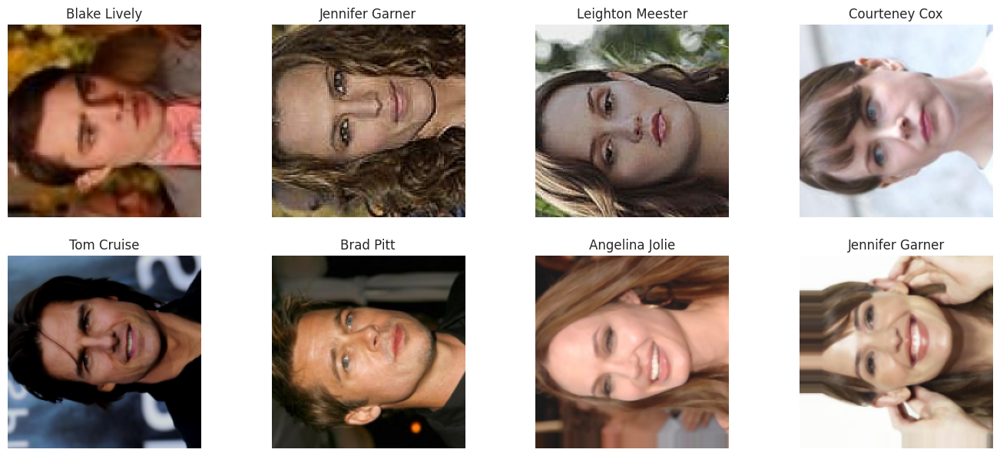

In [12]:
#@title checking the dataloader
x,y = next(iter(train_dataloader))
x = x.cpu().numpy()
y = y.cpu().numpy()
plt.figure(figsize=[17,15])
for i,(row,t) in enumerate(zip(x,y)):
    plt.subplot(4,4,i+1)
    im = row.transpose(2,1,0)
    plt.imshow(im)
    plt.axis("off")
    plt.title(numUni2name[t])
plt.show()

In [13]:
!pip install tensorboard
#@title ## setup tensorboard to follow the graphs
from torch.utils.tensorboard import SummaryWriter
# %load_ext tensorboard
# %reload_ext tensorboard
# experiment = 0
# %tensorboard --logdir=runs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
#@title class AverageMeter(object):
class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [10]:
#@title show_grapgs function
writer = SummaryWriter()

def show_graphs(data, kind='train'):
    # showing accuracy graph
    plt.figure(figsize=(10, 6))
    plt.title(f'{kind} accuracy')
    sns.lineplot(data=data, x='index', y='accuracy')
    plt.show()
    # showing loss graph
    plt.figure(figsize=(10, 6))
    plt.title(f'{kind} loss')
    sns.lineplot(data=data, x='index', y='loss')
    plt.show()


In [11]:
#@title train for cuda
from tqdm import tqdm
DEBUG = False
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

def train(train_loader, model, optimizer, epoch, criterion, writer, TB_try):
    data_graph = pd.DataFrame(columns=['index', 'accuracy', 'loss'])
    at_least_95 = 0
    runner = 0
    model = model.to(device)
    count = 0
    print("starting loop")
    for x in range(1, epoch+1):
        accuracy = Accuracy(task="multiclass", num_classes=num_classes).to(device)
        accuracyMeter = AverageMeter()
        losses = AverageMeter()
        model.train()
        train_loader_tqdm = tqdm(train_loader, desc=f'Epoch {x}', leave=False)
        for i, (img, target) in enumerate(train_loader_tqdm):
            img = img.float().to(device)
            target = target.long().to(device)
            optimizer.zero_grad()
            output = model(img).to(device)
            if DEBUG:
                print('output', output.detach().cpu().numpy(),
                      'shape', output.detach().cpu().numpy().shape)

                print('target', target.detach().cpu().numpy(),
                      'shape', target.detach().cpu().numpy().shape)

            loss = criterion(output, target).to(device)
            loss.backward()
            optimizer.step()
            pred = output.argmax(dim=1, keepdim=True).to(device)
            pred = pred.squeeze().to(device)
            acc = accuracy(pred.clone().detach().to(device), target.clone().detach().to(device))
            losses.update(loss.item(), img.size(0))
            accuracyMeter.update(acc, img.size(0))

            if float(accuracyMeter.avg) >= 0.95:
                at_least_95 += 1
            if at_least_95 == 15:
                print('done training !')
                show_graphs(data_graph)
                return
                print(f'loss: {losses.avg}, accuracy: {accuracyMeter.avg}')

            writer.add_scalar(f'training {TB_try}/loss', losses.avg, runner)
            writer.add_scalar(f'training {TB_try}/accuracy', accuracyMeter.avg, runner)
            data_graph.loc[runner] = [runner] + [float(accuracyMeter.avg)] + [float(losses.avg)]
            runner += 1
        print(f'loss: {losses.avg}, accuracy: {accuracyMeter.avg}')
        if x == epoch:
            show_graphs(data_graph)
            print("finsihedd !!!!")

cuda:0


In [12]:
#@title testing our model
def test(test_loader, model, criterion, writer , TB_try):
  data_graph = pd.DataFrame(columns=['index' , 'accuracy' , 'loss'])
  model =model.to(device)
  accuracy = Accuracy(task="multiclass", num_classes=num_classes).to(device)
  accuracyAV = AverageMeter()
  losses = AverageMeter()
  runner = 0
  test_loader_tqdm = tqdm(test_loader, desc="Test", leave=False)
  for i, (img, target) in enumerate(test_loader_tqdm):

      img = img.float().to(device)
      target = target.long().to(device)
      output = model(img).to(device)


      if DEBUG:
          print('output',output.detach().cpu().numpy(),
                  'shape', output.detach().cpu().numpy().shape )

          print('target',target.detach().cpu().numpy(),
                  'shape', target.detach().cpu().numpy().shape )

      loss = criterion(output, target).to(device)

      pred = output.argmax(dim=1 , keepdim=True).to(device)
      pred = pred.squeeze().to(device)
      #acc = torchmetrics.functional.accuracy(pred, target)
      acc = accuracy(pred.clone().detach().to(device), target.clone().detach().to(device))
      losses.update(loss.item(), img.size(0))
      accuracyAV.update(acc, img.size(0))
      writer.add_scalar(f' test {TB_try}/loss', losses.avg,  runner)
      writer.add_scalar(f' test {TB_try}/accuracy', accuracyAV.avg,  runner)
      data_graph.loc[runner] = [runner] +[float(accuracyAV.avg)] + [float(losses.avg)]
      runner += 1
  print(f'loss : {losses.avg} ,accuracy : {accuracyAV.avg}')
  show_graphs(data_graph , kind = 'test')

In [13]:
#@title showing the confusion matrix
def confusion_matrix_result(model , data_loader):
  gc.collect()
  torch.cuda.empty_cache()
  model.eval()
  all_targets = []
  all_preds = []
  with torch.no_grad():
    data_loader_tqdm = tqdm(data_loader, desc='confusion_matrix_result', leave=False)
    for i, (img , target) in enumerate(data_loader_tqdm):
      img = img.float().to(device)
      target = target.long().to(device)
      output = model(img)

      pred = output.argmax(dim = 1 ,keepdim = True).to(device)
      pred = pred.squeeze().to(device)
      all_targets.append(target.detach().cpu().numpy().tolist())
      all_preds.append(pred.detach().cpu().numpy().flatten().tolist())
  all_targets = reduce(lambda a,b :a + b , all_targets)
  all_preds = reduce(lambda a,b : a + b, all_preds)

  cm = confusion_matrix(all_targets , all_preds , labels = list(range(int(num_classes))))
  plt.figure(figsize=(20,10))
  sns.heatmap(cm , annot = True , fmt = "d" , linewidth = .6)
  plt.xlabel("predict labels")
  plt.ylabel("true labels")

In [14]:
#@title showing 1 image that the model predict it well and 1 image that the modek predict it wrong
def TP_and_NF(model , data_loader):
  gc.collect()
  torch.cuda.empty_cache()
  model.eval()
  TP_index  = -1
  NF_index  = -1
  torch.no_grad()
  index ,(img ,target) =next( enumerate(data_loader))
  #print(img)
  #print(target)
  img = img.float().to(device)
  target = target.long().to(device)
  output = model(img)

  pred = output.argmax(dim = 1 ,keepdim = True).to(device)
  pred = pred.squeeze().to(device)
  pred_list = pred.detach().cpu().numpy().flatten().tolist()
  target_list = target.detach().cpu().numpy().tolist()
  for i in range(len(pred_list)):
    if pred_list[i] == target_list[i]:
      TP_index = i
    if pred_list[i] != target_list[i]:
      NF_index = i
      NF_expected_index = target_list[i]
      NF_predicted_index = pred_list[i]
    if TP_index != -1 and NF_index != -1:
      break
  if TP_index != -1 and NF_index != -1:
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(12,6))

    img =img.int()
    ax1.axis('off')
    ax1.set_title(f'TP :{numUni2name[target_list[TP_index]]}')
    ax1.imshow(np.array(img[TP_index].permute(2,1,0).cpu()))
    ax2.axis('off')
    ax2.set_title(f'NF target : {numUni2name[NF_expected_index]} predicted : {numUni2name[NF_predicted_index]} ')
    ax2.imshow(np.array(img[NF_index].permute(2,1,0).cpu()))
  else:
    print('ERROR 404 : TP or NF not Found')



In [15]:
#@title general function for every model , to train and show graphs and test our model and see the confusion matrix and TP and NF images
def train_model_and_show_graphs(model, train_dataloader ,test_dataloader,writer , TB_try, max_epoch_number=30):
  optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0001)
  critirion = torch.nn.CrossEntropyLoss()

  print('training the model !')
  train(train_dataloader,model=model ,optimizer= optimizer , criterion= critirion , epoch= max_epoch_number ,writer = writer,TB_try = TB_try)

  print('testing the model !')
  test(test_loader= test_dataloader, model = model , criterion= critirion,writer = writer , TB_try = 1)

  print('confusion matrix:')
  confusion_matrix_result(model, test_dataloader)

  print('TP and NF images ')
  TP_and_NF(model , test_dataloader)

  return model

In [16]:
def save_model(model,model_name):
  torch.save(model, f"./{model_name}.pth")
  print(f"model {model_name} saved ! ")

In [23]:
#@title ##Model 1 : VGG16
vgg16_model = VGG16(n_classes = num_classes)

training the model !
starting loop


loss: 2.6258484976632253, accuracy: 0.14540815353393555


loss: 2.6001486997215117, accuracy: 0.14795918762683868


loss: 2.5785688113193124, accuracy: 0.14795918762683868


loss: 2.5597371957740007, accuracy: 0.14795918762683868


loss: 2.5423517397471835, accuracy: 0.14795918762683868


loss: 2.527101592141755, accuracy: 0.14795918762683868


loss: 2.51326060295105, accuracy: 0.14795918762683868


loss: 2.501156811811486, accuracy: 0.14795918762683868


loss: 2.490055108556942, accuracy: 0.14795918762683868


loss: 2.481143133980887, accuracy: 0.14795918762683868


loss: 2.471933588689687, accuracy: 0.14795918762683868


loss: 2.466150478440888, accuracy: 0.14795918762683868


loss: 2.460214695151971, accuracy: 0.14795918762683868


loss: 2.4530750853674754, accuracy: 0.14795918762683868


loss: 2.449210003930695, accuracy: 0.14795918762683868


loss: 2.4419773646763394, accuracy: 0.14795918762683868


loss: 2.4352894364571083, accuracy: 0.14795918762683868


loss: 2.4316858661418057, accuracy: 0.14795918762683868


loss: 2.428996268583804, accuracy: 0.15051020681858063


loss: 2.4235359697925802, accuracy: 0.1428571343421936


loss: 2.428437432464288, accuracy: 0.14413264393806458


loss: 2.424397371253189, accuracy: 0.1390306055545807


loss: 2.4178528566749726, accuracy: 0.15561224520206451


loss: 2.4229201832596137, accuracy: 0.1428571343421936


loss: 2.4178118194852556, accuracy: 0.1428571343421936


loss: 2.4235900737801375, accuracy: 0.14668366312980652


loss: 2.421054334056621, accuracy: 0.14158162474632263


loss: 2.417094705056171, accuracy: 0.14923469722270966


loss: 2.4201053453951467, accuracy: 0.14923469722270966


loss: 2.414316393891159, accuracy: 0.1428571343421936


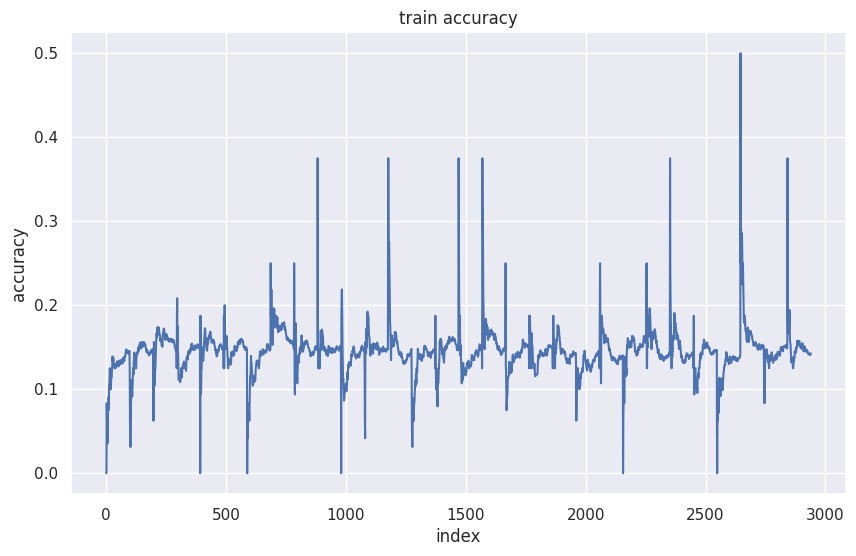

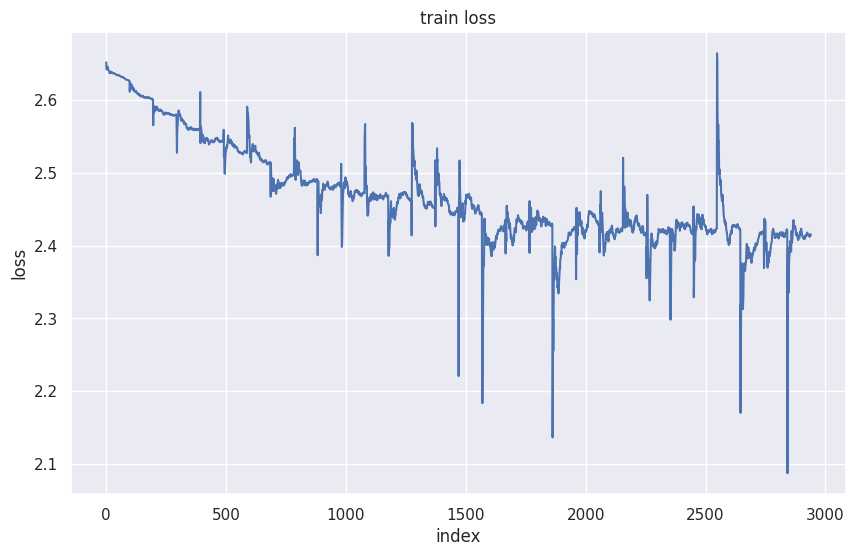

finsihedd !!!!
testing the model !


loss : 2.3991548787979853 ,accuracy : 0.1577381044626236


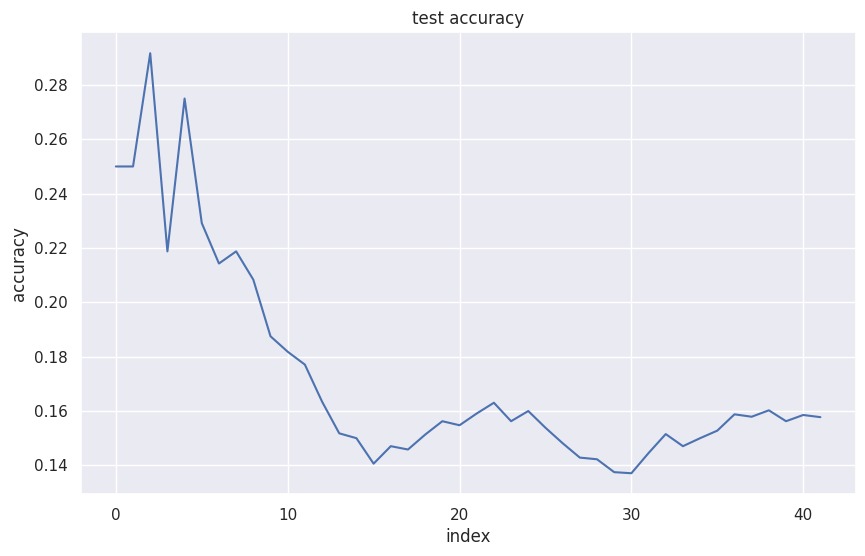

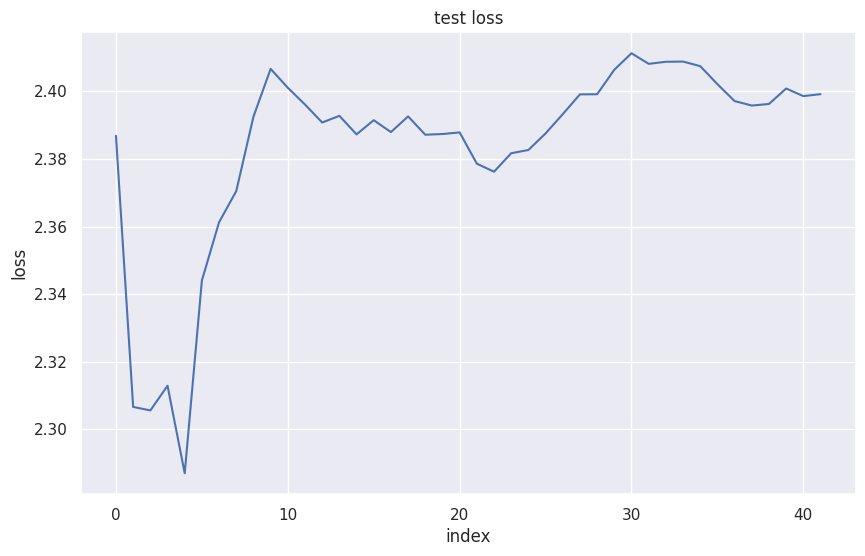

confusion matrix:


TP and NF images 


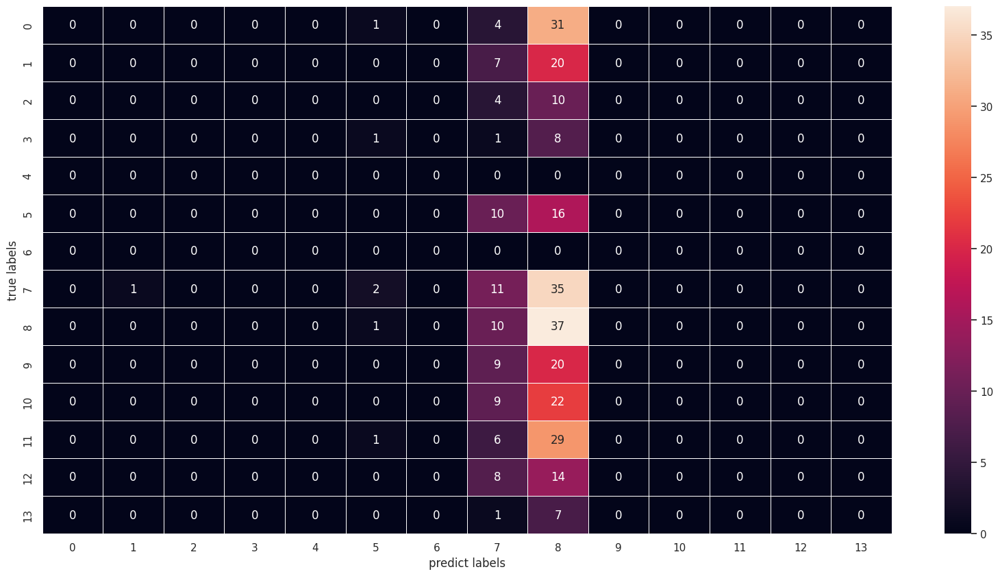

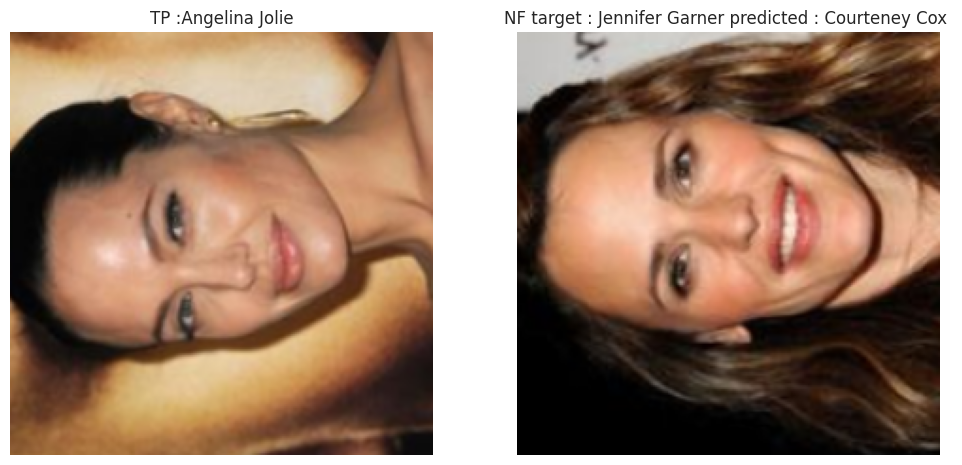

In [24]:
vgg16_model = train_model_and_show_graphs(vgg16_model , train_dataloader =train_dataloader  ,test_dataloader = test_dataloader ,writer = writer , TB_try =1 )


In [25]:
save_model(vgg16_model,"vgg16_model")

model vgg16_model saved ! 


training the model !
starting loop


loss: 2.299192334924425, accuracy: 0.21301020681858063


loss: 1.6842081577193981, accuracy: 0.44897958636283875


loss: 1.2206659639368251, accuracy: 0.6352040767669678


loss: 0.8592869304880804, accuracy: 0.7474489808082581


loss: 0.6719112060203845, accuracy: 0.8150510191917419


loss: 0.4124165879828589, accuracy: 0.9005101919174194


loss: 0.39122469932297055, accuracy: 0.8775510191917419


loss: 0.2974704469991278, accuracy: 0.918367326259613


loss: 0.2915314328951799, accuracy: 0.9285714030265808


Epoch 10:   8%|▊         | 8/98 [00:01<00:19,  4.70it/s]

done training !


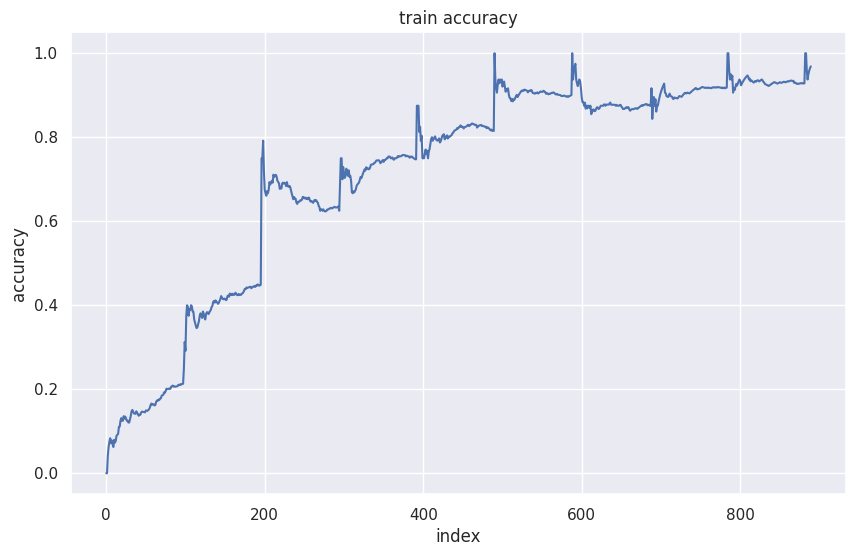

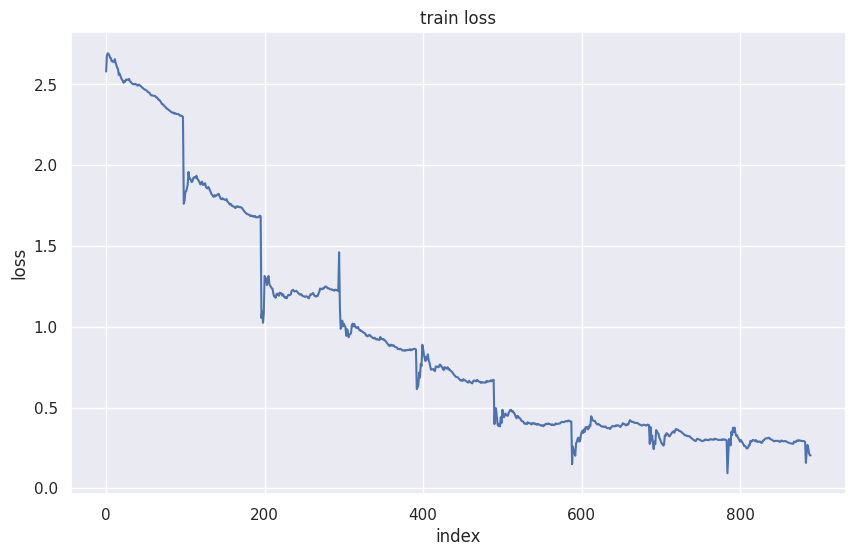

testing the model !


loss : 0.8958908354952222 ,accuracy : 0.7291666865348816


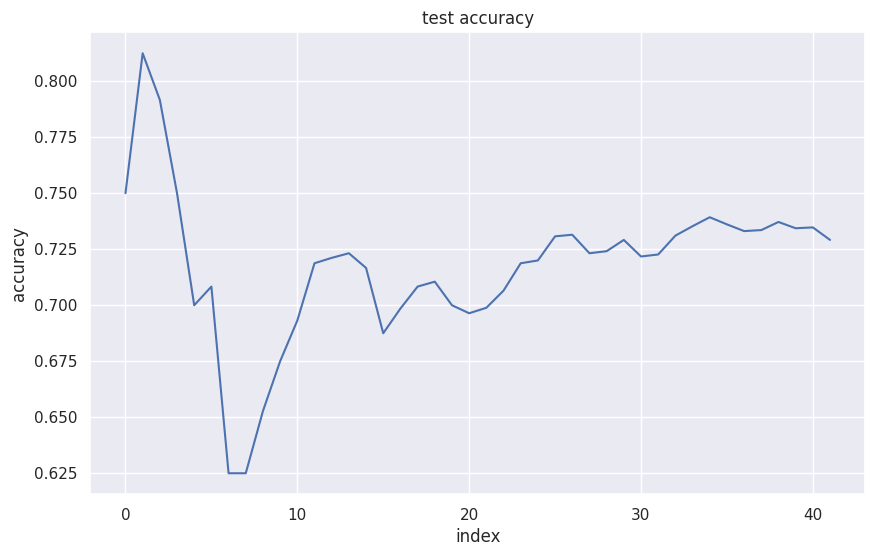

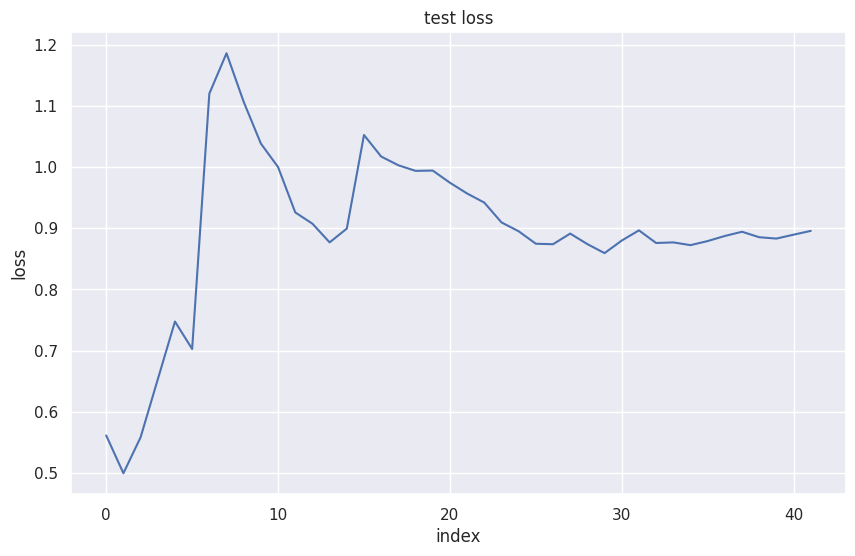

confusion matrix:


TP and NF images 


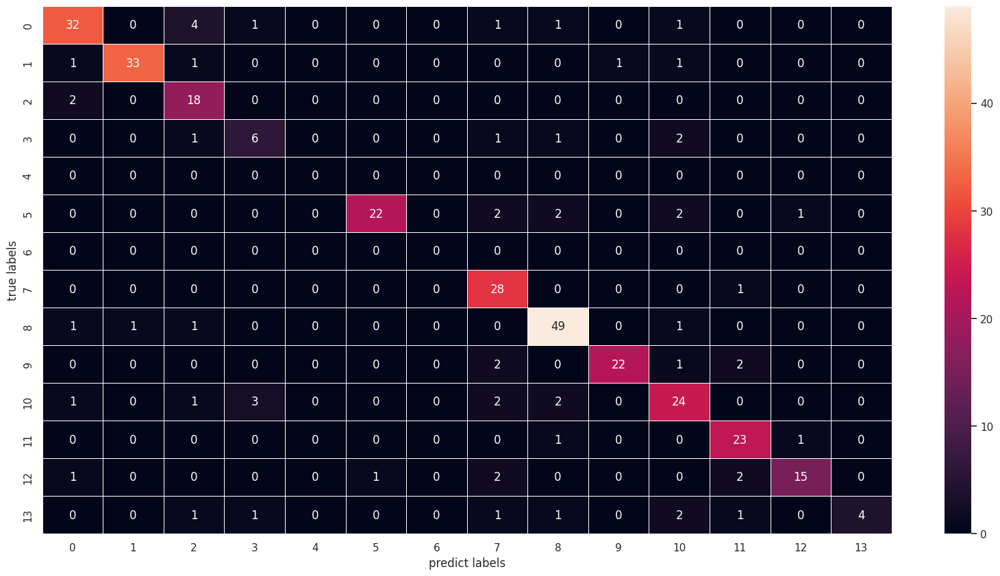

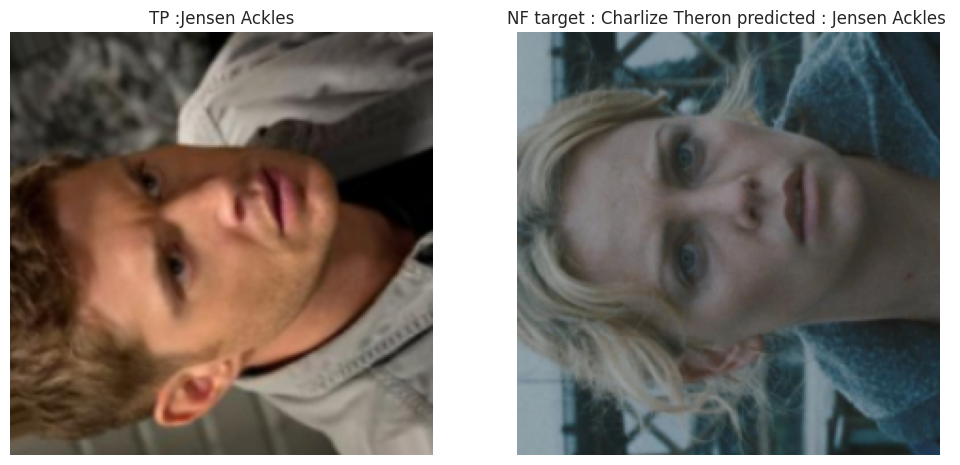

In [23]:
#@title ##Model 2: inception v4
model_inception_v4 = timm.create_model('inception_v4', pretrained=True, num_classes=num_classes).to(device)
model_inception_v4 = train_model_and_show_graphs(model_inception_v4 , train_dataloader =train_dataloader  ,test_dataloader = test_dataloader ,writer = writer , TB_try =2 )


In [52]:
save_model(model_inception_v4,"model_inception_v4")

model model_inception_v4 saved ! 


training the model !
starting loop


loss: 2.399099329904634, accuracy: 0.24872449040412903


loss: 1.2711839286648496, accuracy: 0.6033163070678711


loss: 0.8269763494632683, accuracy: 0.7295918464660645


loss: 0.5352117579658421, accuracy: 0.8252550959587097


loss: 0.4460846169718674, accuracy: 0.8788264989852905


loss: 0.29569812620780905, accuracy: 0.9323979616165161


loss: 0.2581928222991374, accuracy: 0.9285714030265808


loss: 0.21669953160596137, accuracy: 0.9400510191917419


Epoch 9:   6%|▌         | 6/98 [00:00<00:09,  9.62it/s]

done training !


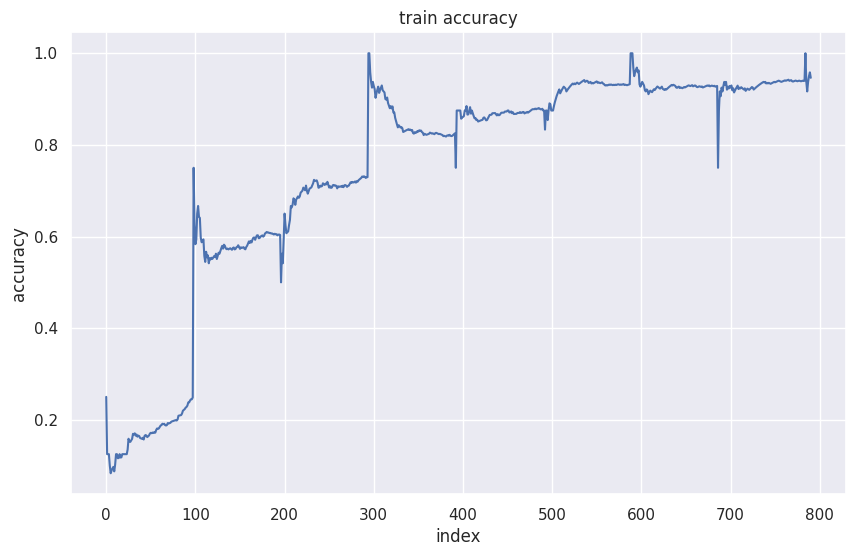

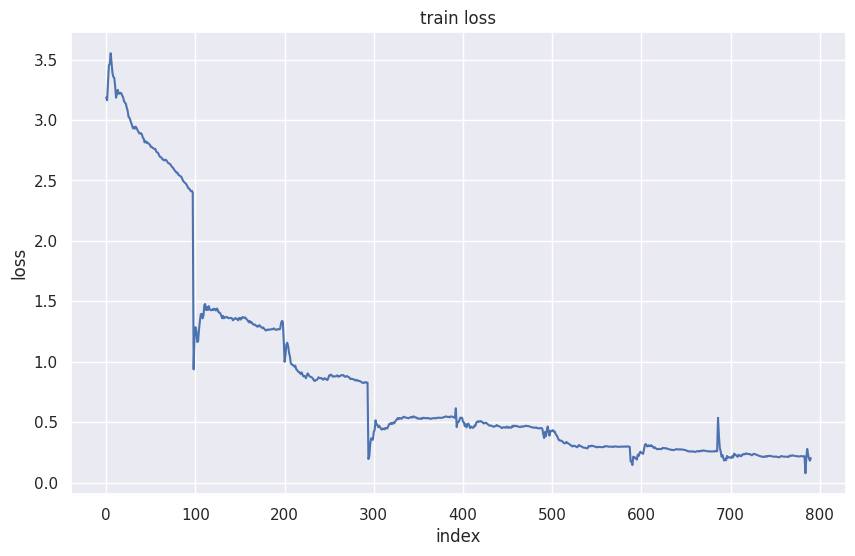

testing the model !


loss : 1.0699333083771525 ,accuracy : 0.7142857313156128


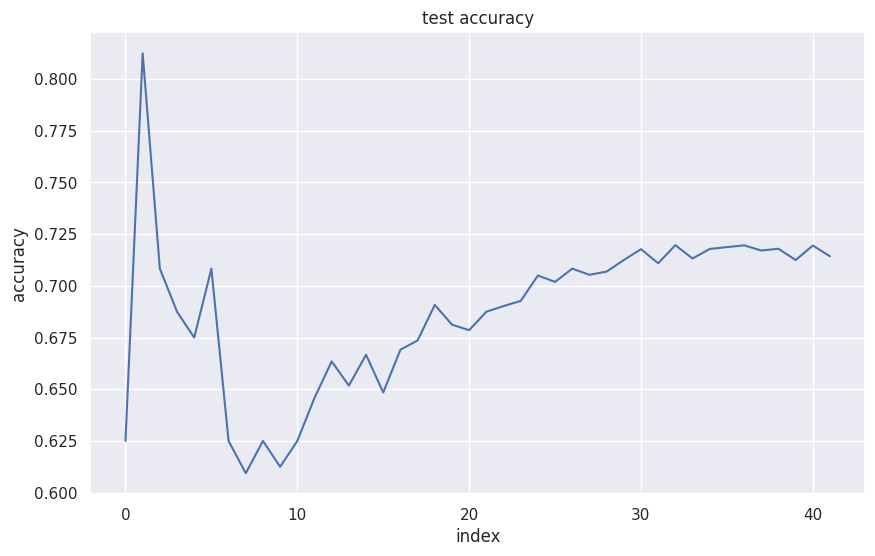

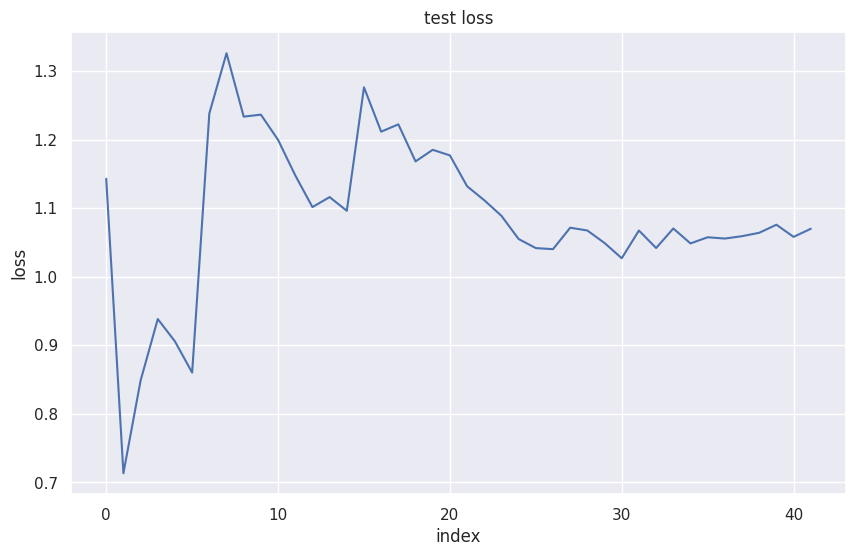

confusion matrix:


TP and NF images 


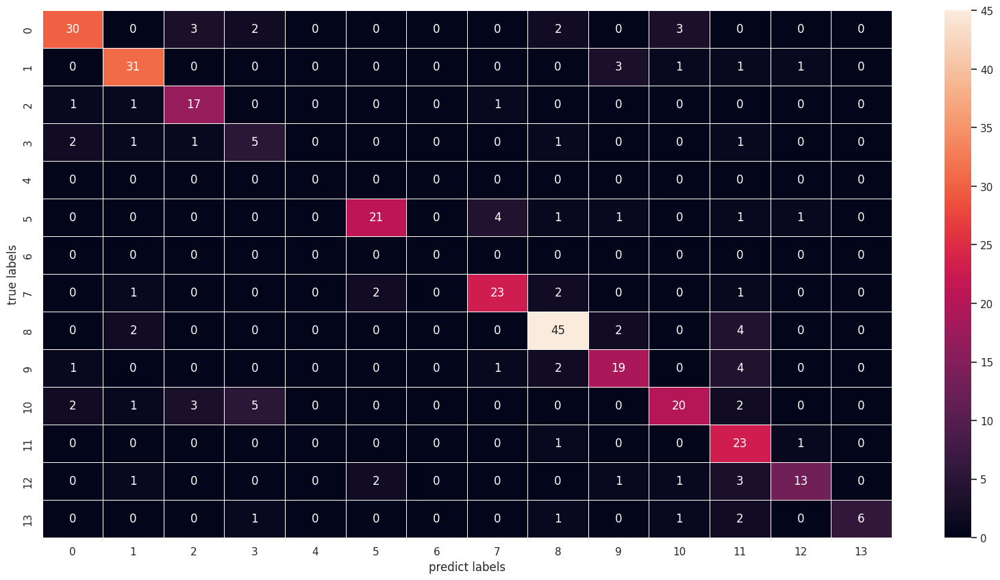

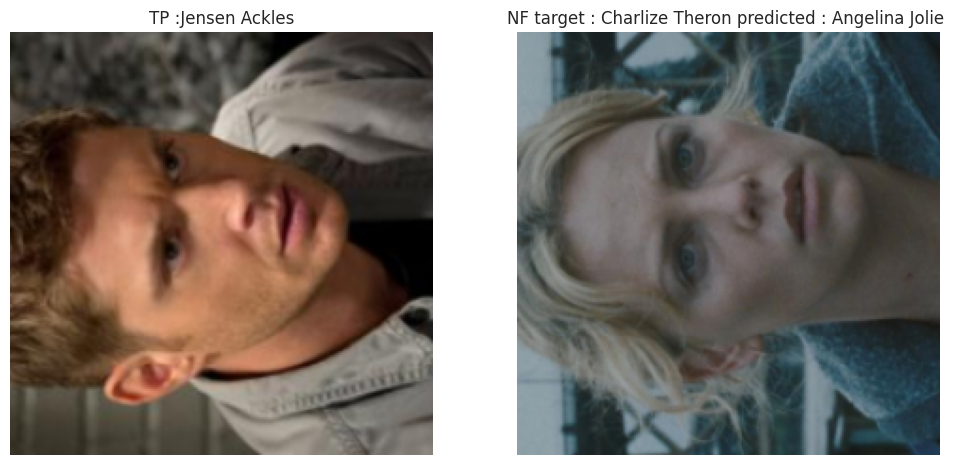

In [24]:
#@title Model 3: mobile net v3
mobile_net_3_model = timm.create_model('mobilenetv3_large_100', pretrained=True, num_classes=num_classes).to(device)
mobile_net_3_model = train_model_and_show_graphs(mobile_net_3_model , train_dataloader =train_dataloader  ,test_dataloader = test_dataloader ,writer = writer , TB_try =3 )


In [53]:
save_model(mobile_net_3_model,"mobile_net_3_model")

model mobile_net_3_model saved ! 


training the model !
starting loop


loss: 2.165142244222213, accuracy: 0.2627550959587097


loss: 1.3311318067871794, accuracy: 0.5420918464660645


loss: 0.9076853493342594, accuracy: 0.7181122303009033


loss: 0.6064588875338739, accuracy: 0.8048469424247742


loss: 0.3489401001787307, accuracy: 0.9005101919174194


loss: 0.3395712313869474, accuracy: 0.8954081535339355


loss: 0.2465931180750533, accuracy: 0.9311224222183228


Epoch 8:  14%|█▍        | 14/98 [00:02<00:17,  4.72it/s]

done training !


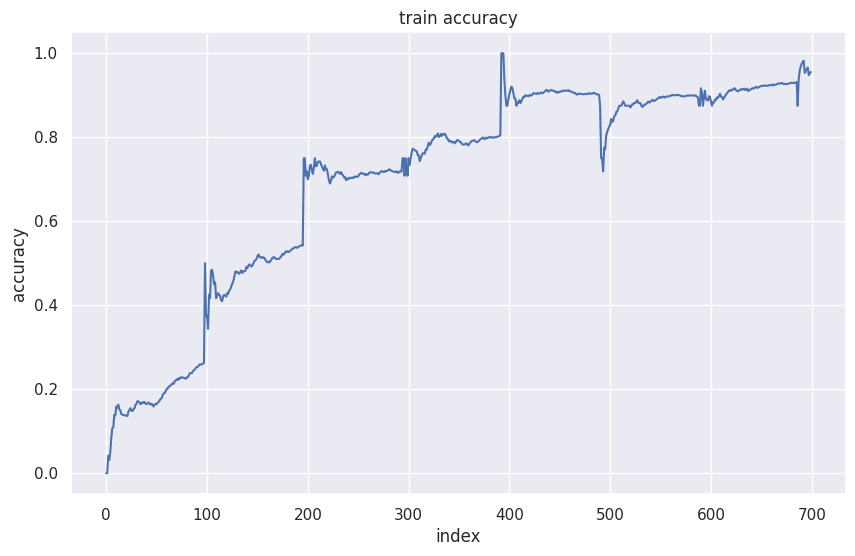

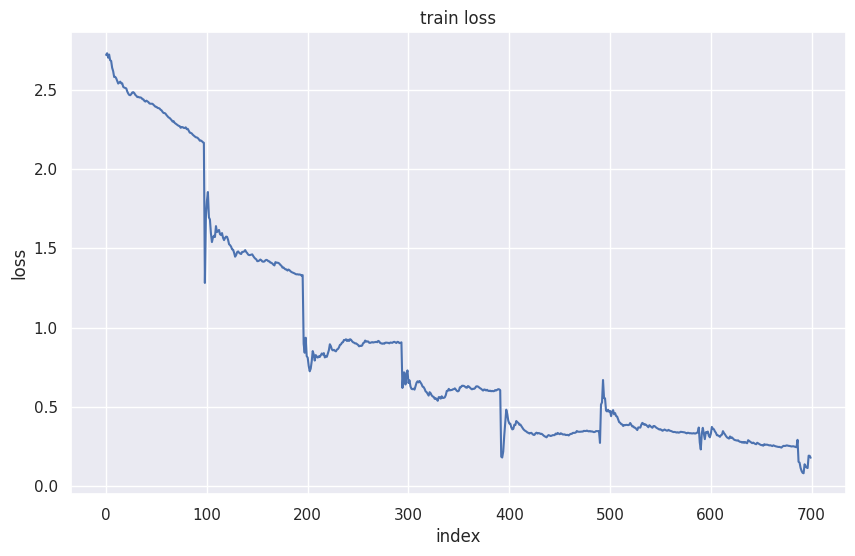

testing the model !


loss : 0.7089586937356562 ,accuracy : 0.7916666865348816


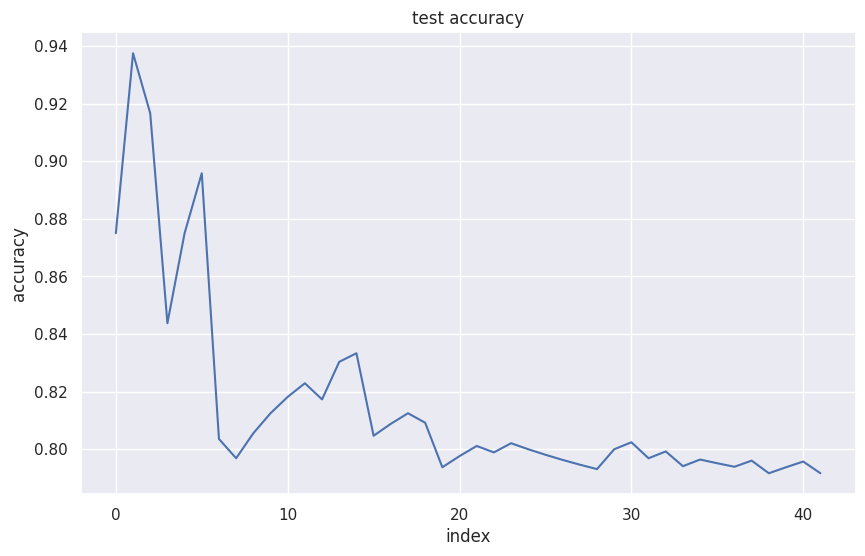

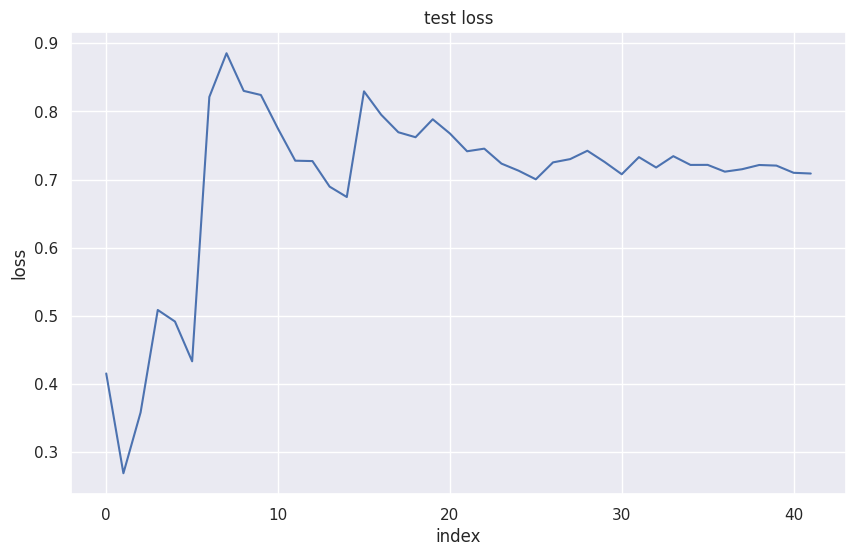

confusion matrix:


TP and NF images 


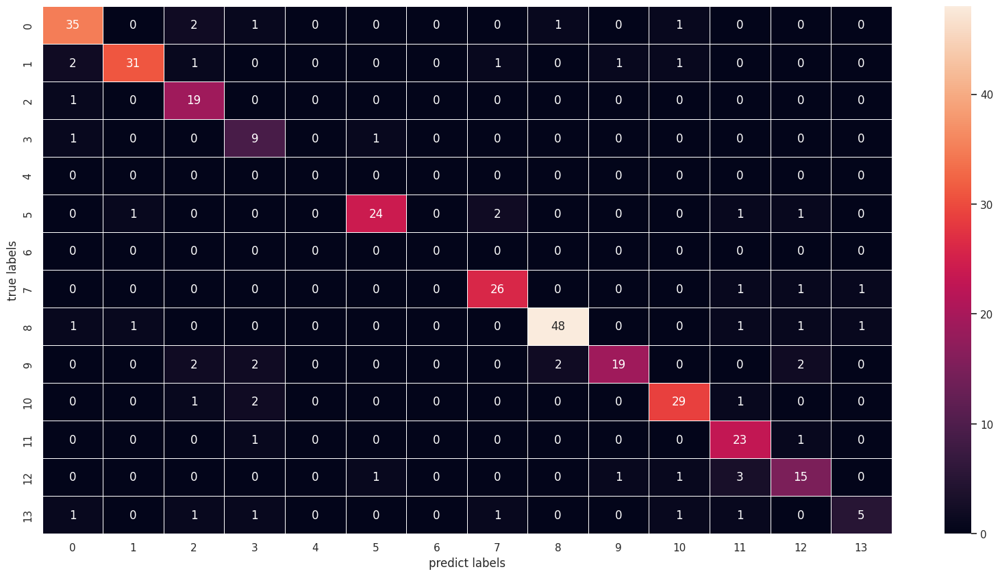

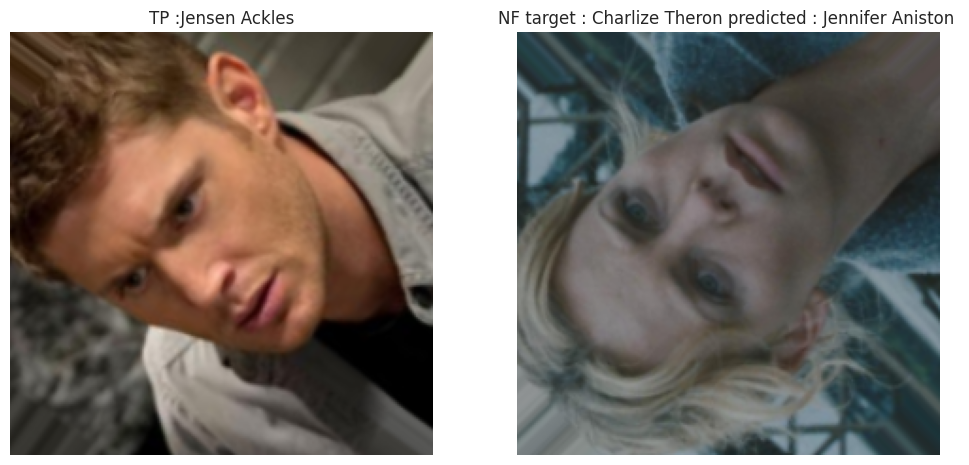

In [25]:
#@title ##Model 4:resnet50
model_resnet = timm.create_model('resnest50d', pretrained=True, num_classes=num_classes).to(device)
model_resnet = train_model_and_show_graphs(model_resnet , train_dataloader =train_dataloader  ,test_dataloader = test_dataloader ,writer = writer , TB_try =4 )


In [54]:
save_model(model_resnet,"model_resnet")

model model_resnet saved ! 


training the model !
starting loop


loss: 2.8063950465649974, accuracy: 0.09693877398967743


loss: 2.506264713345742, accuracy: 0.14795918762683868


loss: 2.3551856011760477, accuracy: 0.20918366312980652


loss: 2.1849518953537452, accuracy: 0.2691326439380646


loss: 2.0273892733515524, accuracy: 0.34183672070503235


loss: 1.9577135309881093, accuracy: 0.3443877398967743


loss: 1.8280119117425413, accuracy: 0.43494898080825806


loss: 1.7545409810786345, accuracy: 0.4413265287876129


loss: 1.637592086378409, accuracy: 0.4566326439380646


loss: 1.5556205669227912, accuracy: 0.5114795565605164


loss: 1.4513373776358, accuracy: 0.5293367505073547


loss: 1.3495400061412735, accuracy: 0.5714285373687744


loss: 1.2935706161114635, accuracy: 0.6033163070678711


loss: 1.1549219349209143, accuracy: 0.6390305757522583


loss: 1.1368032243787025, accuracy: 0.6479591727256775


loss: 1.0114475394390068, accuracy: 0.6811224222183228


loss: 0.9792956755477555, accuracy: 0.6938775181770325


loss: 0.9047450961507096, accuracy: 0.71683669090271


loss: 0.8066425676248512, accuracy: 0.7563775181770325


loss: 0.7622481295648886, accuracy: 0.7691326141357422


loss: 0.7087378421304177, accuracy: 0.776785671710968


loss: 0.6884666824219178, accuracy: 0.7895408272743225


loss: 0.6332590995090348, accuracy: 0.8022959232330322


loss: 0.5858073000777133, accuracy: 0.8163264989852905


loss: 0.5843514262185413, accuracy: 0.8022959232330322


loss: 0.5281121351433044, accuracy: 0.8431122303009033


loss: 0.5267344206115421, accuracy: 0.8482142686843872


loss: 0.45730071777135745, accuracy: 0.8482142686843872


loss: 0.44601772534565964, accuracy: 0.8673469424247742


loss: 0.4547530330185379, accuracy: 0.8622449040412903


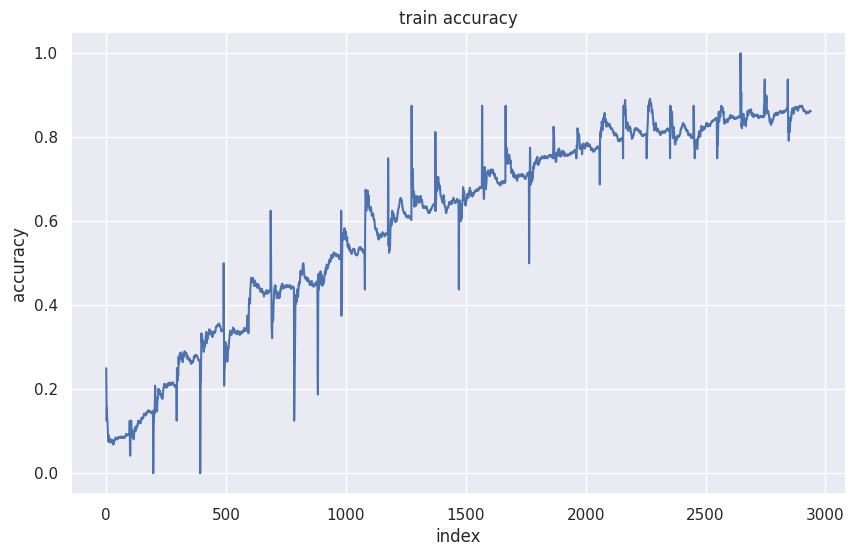

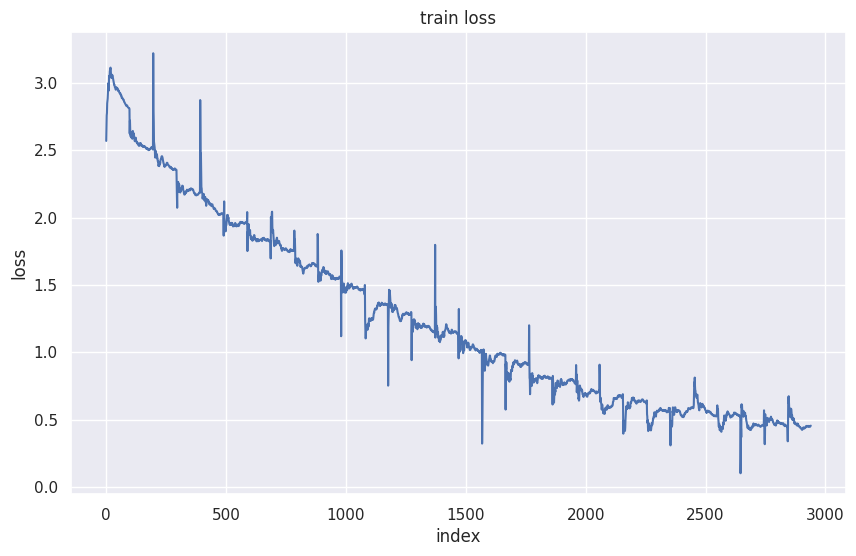

finsihedd !!!!
testing the model !


loss : 1.303098540930521 ,accuracy : 0.6220238208770752


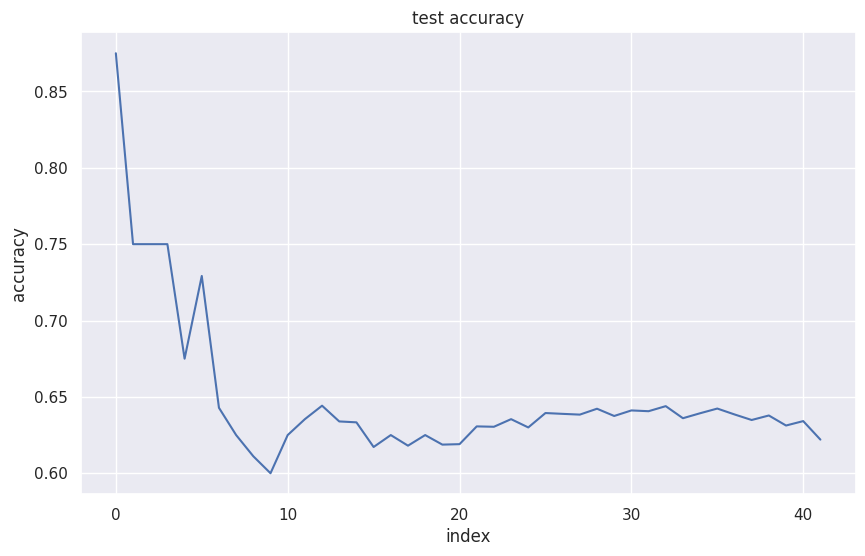

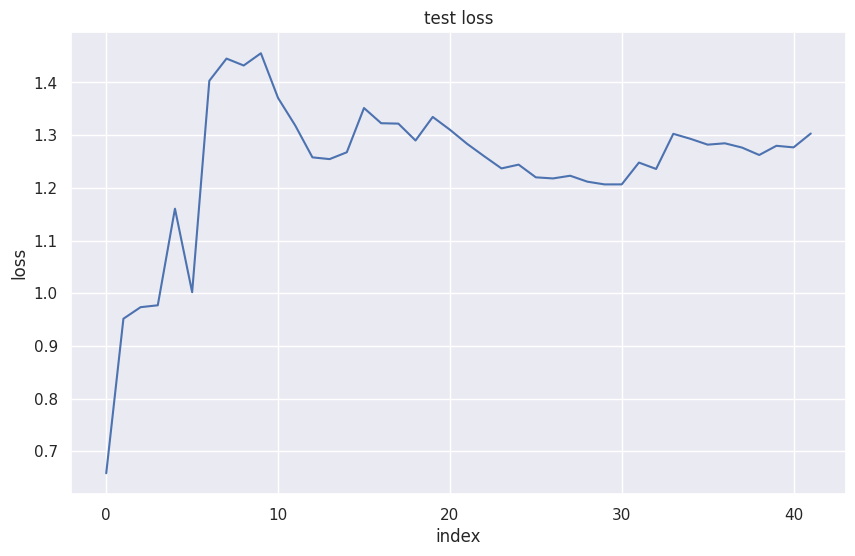

confusion matrix:


TP and NF images 


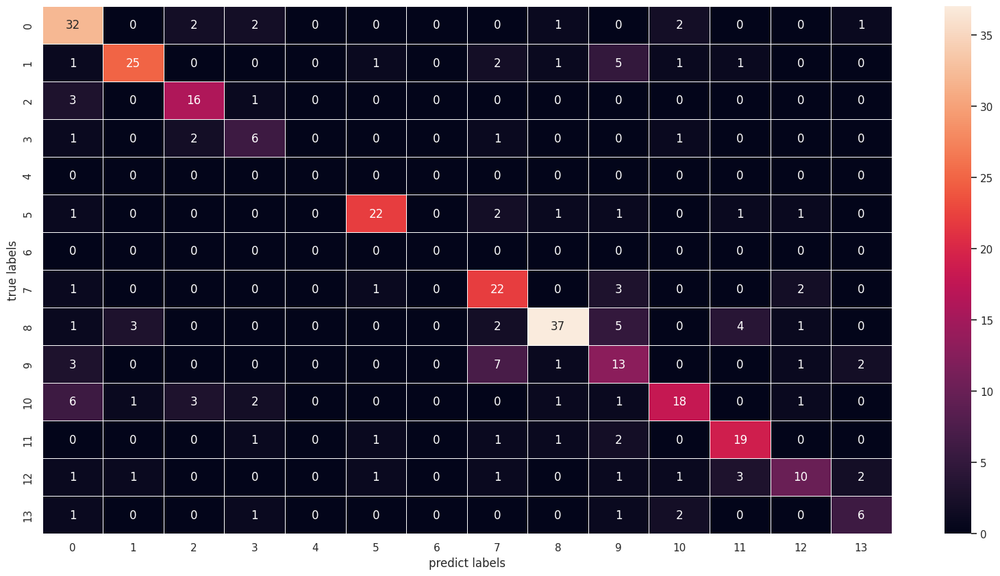

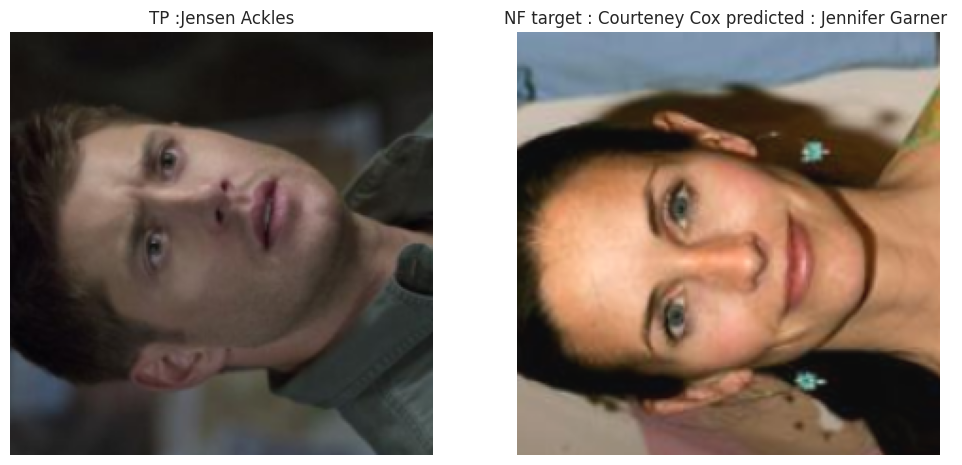

In [26]:
#@title ##Model 5:effiecient net
effiecient_net = timm.create_model('efficientnet_b4', pretrained=True, num_classes=num_classes).to(device)
effiecient_net = train_model_and_show_graphs(effiecient_net , train_dataloader =train_dataloader  ,test_dataloader = test_dataloader ,writer = writer , TB_try =5 )


In [55]:
save_model(effiecient_net,"effiecient_net")

model effiecient_net saved ! 


In [28]:
#@title ## Tensorboard
%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

In [26]:
# Load individual models
vgg16_model = torch.load(
    "/content/vgg16_model.pth", map_location=device
)
model_resnet = torch.load(
    "/content/model_resnet.pth", map_location=device
)
model_inception_v4 = torch.load(
    "/content/model_inception_v4.pth", map_location=device
)
mobile_net_3_model = torch.load(
    "/content/mobile_net_3_model.pth", map_location=device
)
effiecient_net = torch.load(
    "/content/effiecient_net.pth", map_location=device
)

In [27]:
#@title ##ensembles

# Define the ensemble model
class EnsembleModel(nn.Module):
    def __init__(self, models):
        super(EnsembleModel, self).__init__()
        self.models = nn.ModuleList(models)

    def forward(self, x):
        outputs = [model(x) for model in self.models]
        average_output = sum(outputs) / len(outputs)
        return average_output

def train_ensemble_model_and_show_graphs(model, train_dataloader ,test_dataloader,writer , TB_try, max_epoch_number=30):
  optimizer = torch.optim.Adam([dict(params=model.parameters(), lr=0.001),])
  critirion = torch.nn.CrossEntropyLoss()

  print('training the model !')
  train(train_dataloader,model=model ,optimizer= optimizer , criterion= critirion , epoch= max_epoch_number ,writer = writer,TB_try = TB_try)

  print('testing the model !')
  test(test_loader= test_dataloader, model = model , criterion= critirion,writer = writer , TB_try = 1)

  print('confusion matrix:')
  confusion_matrix_result(model, test_dataloader)

  print('TP and NF images ')
  TP_and_NF(model , test_dataloader)

  return model

training the model !
starting loop


loss: 0.5808289443731917, accuracy: 0.8265305757522583


loss: 0.40948218203206754, accuracy: 0.8839285373687744


loss: 0.3504439803524589, accuracy: 0.8941326141357422


Epoch 4:   0%|          | 0/98 [00:00<?, ?it/s]

done training !


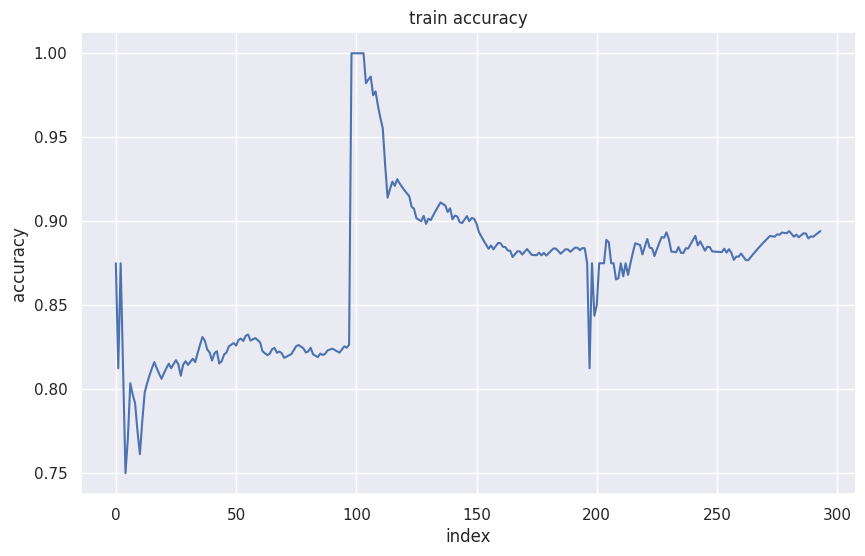

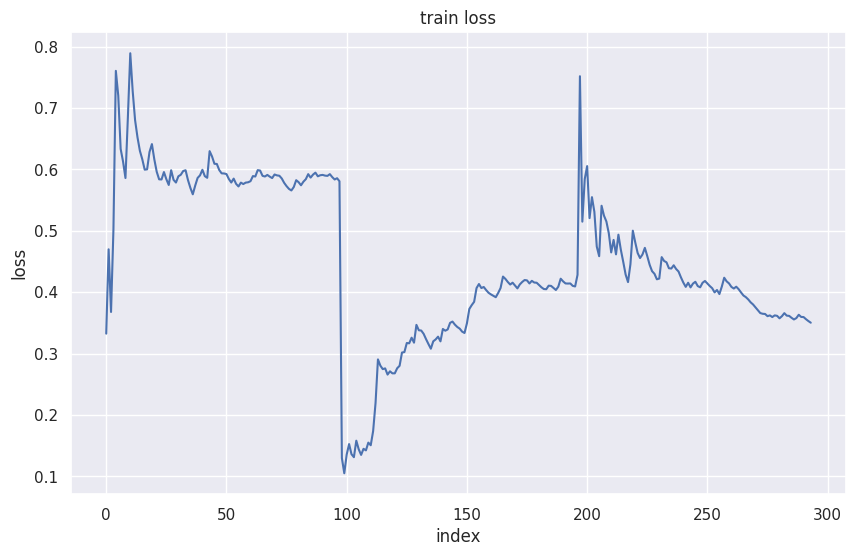

testing the model !


loss : 0.8570034912831727 ,accuracy : 0.7797619104385376


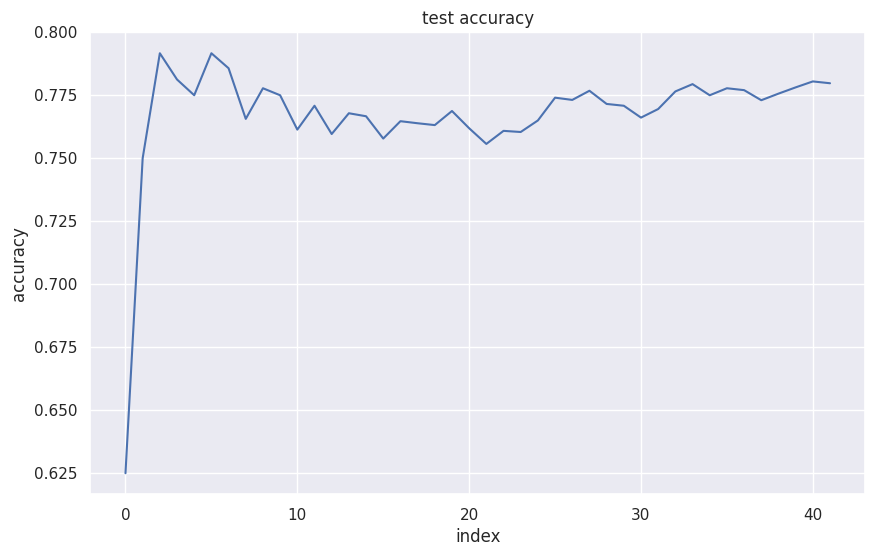

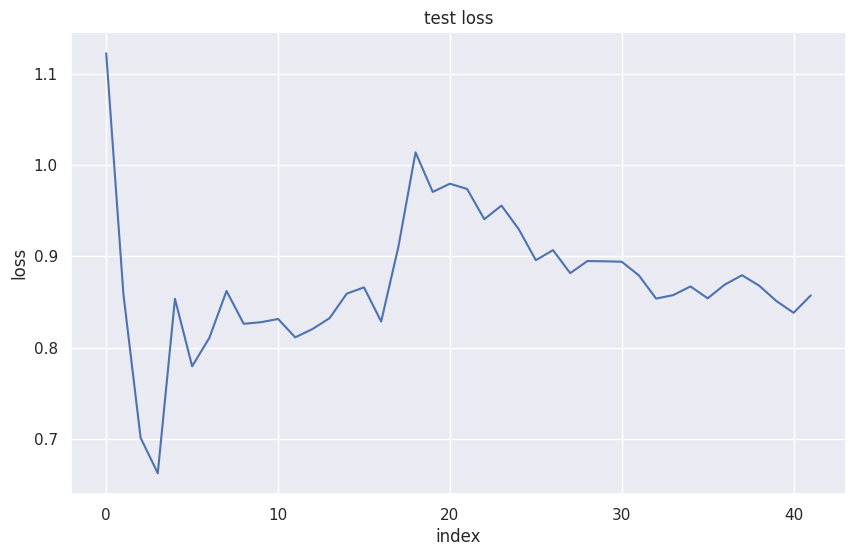

confusion matrix:


TP and NF images 


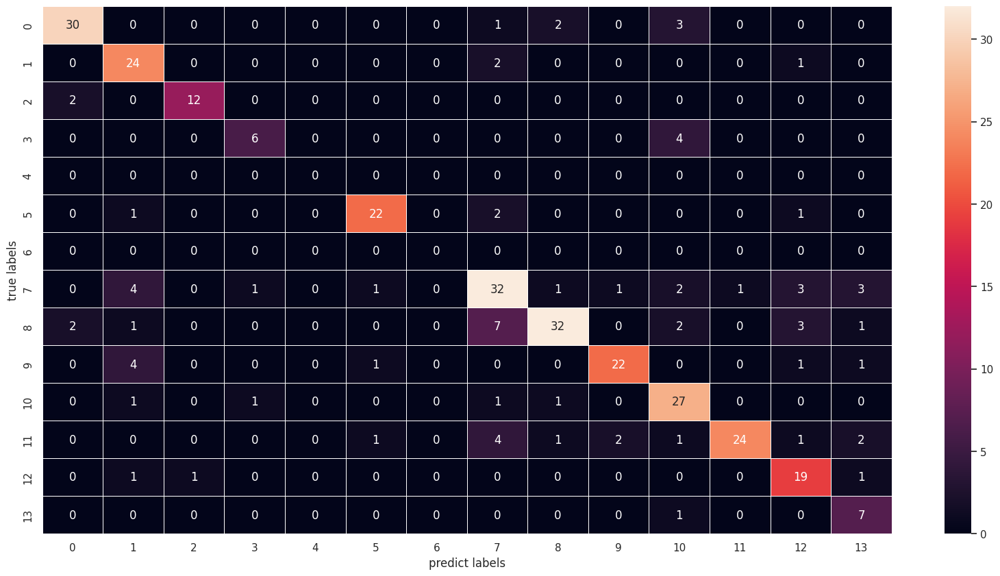

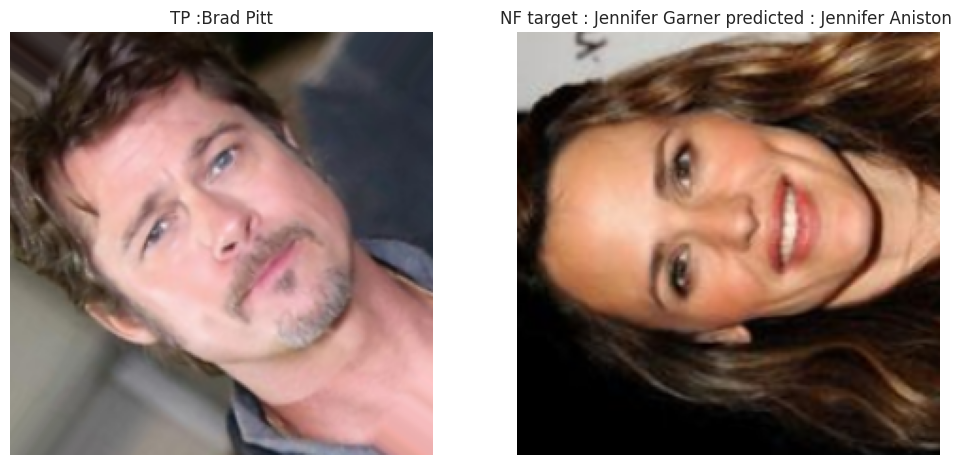

In [29]:

# Create the ensemble model
#model = EnsembleModel([vgg16_model, model_resnet, model_inception_v4 ,mobile_net_3_model ,effiecient_net])
max_epoch_number = 5
#loss = nn.CrossEntropyLoss()
# Set Optimizer

# Create the ensemble model
ensemble_model = EnsembleModel([vgg16_model, mobile_net_3_model,model_inception_v4, model_resnet, effiecient_net])
ensemble_model = train_ensemble_model_and_show_graphs(ensemble_model,train_dataloader=train_dataloader,test_dataloader = test_dataloader ,writer = writer,TB_try=6,max_epoch_number=max_epoch_number )

#Comparing The Results

## VGG16:
- Training Loss: 2.414316393891159
- Training accuracy: 0.1428571343421936
- Validation Loss: 2.3991548787979853
- Validation accuracy: 0.1577381044626236 </font>

## inception v4:
- Training Loss: 0.2915314328951799
- Training accuracy: 0.9285714030265808
- Validation Loss: 0.8958908354952222
- Validation accuracy: 0.7291666865348816 </font>

##mobile_net_3_model v4:
- Training Loss: 0.21669953160596137
- Training accuracy: 0.9400510191917419
- Validation Loss: 1.0699333083771525
- Validation accuracy: 0.7142857313156128 </font>

## model_resnet v4:
- Training Loss: 0.2465931180750533
- Training accuracy: 0.9311224222183228
- Validation Loss: 0.7089586937356562
- Validation accuracy: 0.7916666865348816 </font>

## effiecient_net v4:
- Training Loss: 0.4547530330185379
- Training accuracy: 0.8622449040412903
- Validation Loss: 1.303098540930521
- Validation accuracy: 0.6220238208770752 </font>

## effiecient_net v4:
- Training Loss: 0.4547530330185379
- Training accuracy: 0.8622449040412903
- Validation Loss: 1.303098540930521
- Validation accuracy: 0.6220238208770752 </font>


## ensemble_model
- Training Loss: 0.3504439803524589
- Training accuracy: 0.8941326141357422
- Validation Loss: 0.8570034912831727
- Validation accuracy: 0.7797619104385376 </font>

Now, let's consider the ensemble model:

Ensemble:
combines the predictions of multiple individual models to make a final prediction. In this case, it appears that the ensemble model not performing a  better than most of the individual models in terms of both training and validation  scores.  </font>


In conclusion, the ensemble model shows good results and can be a robust approach for improving the overall performance compared to using any of the individual models alone.
but in this case its seems that model_resnet v4 and modelnet3 is good alone.

In [31]:
#@title ## converting to HTML faild !
%%shell
jupyter nbconvert --to html /content/EX3.ipynb;

[NbConvertApp] Converting notebook /content/EX3.ipynb to html
[NbConvertApp] ERROR | Notebook JSON is invalid: Additional properties are not allowed ('metadata' was unexpected)

Failed validating 'additionalProperties' in stream:

On instance['cells'][29]['outputs'][1]:
{'metadata': {'tags': None},
 'name': 'stdout',
 'output_type': 'stream',
 'text': 'training the model !\nstarting loop\n'}
Traceback (most recent call last):
  File "/usr/local/bin/jupyter-nbconvert", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python3.10/dist-packages/jupyter_core/application.py", line 277, in launch_instance
    return super().launch_instance(argv=argv, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance
    app.start()
  File "/usr/local/lib/python3.10/dist-packages/nbconvert/nbconvertapp.py", line 423, in start
    self.convert_notebooks()
  File "/usr/local/lib/python3.10/dist-packages/nbconvert/nbconvertapp.p

CalledProcessError: ignored